In [ ]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

In [5]:
import tensorflow as tf
print(tf.__version__)

2.6.0


In [6]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [7]:
!mkdir -p ~/aiffel/cats_vs_dogs/PetImages
!ln -s ~/data/* ~/aiffel/cats_vs_dogs/

ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cats_vs_dogs/my_dog.jpg': File exists


In [8]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/cats_vs_dogs/',
    download=False,
    with_info=True,
    as_supervised=True,
)

In [9]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [10]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


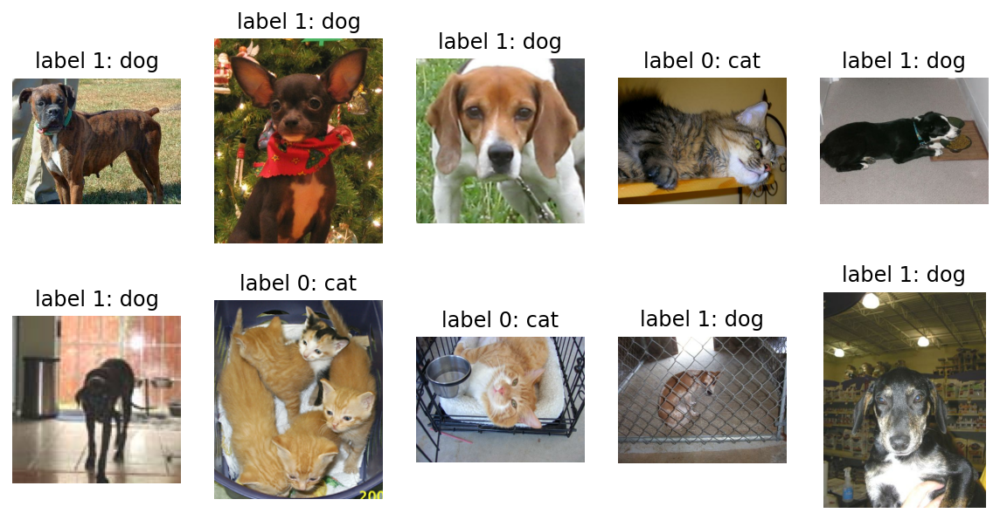

In [11]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [12]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


In [13]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


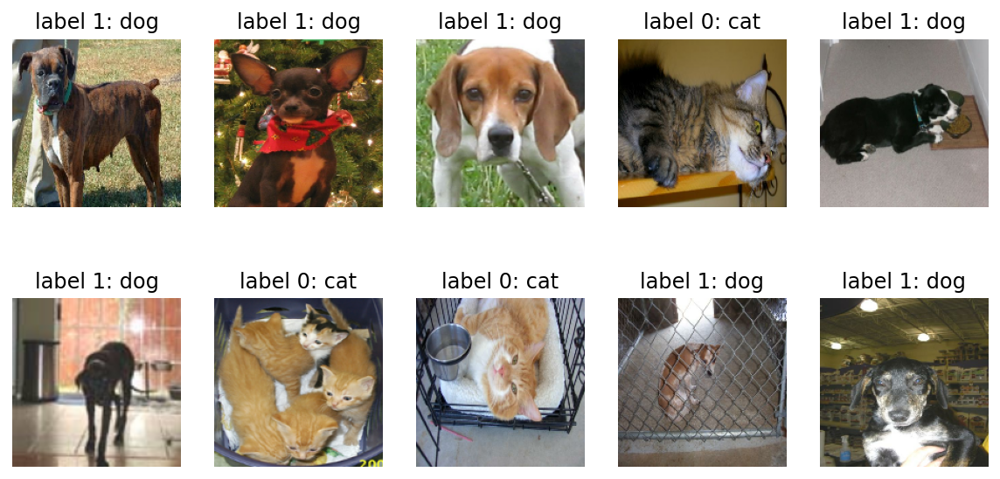

In [14]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [16]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

print("슝~")

슝~


In [17]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [18]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [19]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


In [20]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [21]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [22]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [23]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 9/20 [============>.................] - ETA: 0s - loss: 0.6984 - accuracy: 0.4861

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


20/20 [==============================] - 4s 43ms/step - loss: 0.6955 - accuracy: 0.4953
initial loss: 0.70
initial accuracy: 0.50


Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


In [24]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
168/582 [=======>......................] - ETA: 21s - loss: 0.7171 - accuracy: 0.5846

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 21s - loss: 0.7005 - accuracy: 0.5998

211/582 [=========>....................] - ETA: 20s - loss: 0.6969 - accuracy: 0.6028

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 17s - loss: 0.6744 - accuracy: 0.6191

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 5s - loss: 0.6279 - accuracy: 0.6553

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 5s - loss: 0.6253 - accuracy: 0.6572

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 4s - loss: 0.6233 - accuracy: 0.6586

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 2s - loss: 0.6180 - accuracy: 0.6631

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.6168 - accuracy: 0.6639

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.6136 - accuracy: 0.6666

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 43s 70ms/step - loss: 0.6136 - accuracy: 0.6666 - val_loss: 0.5379 - val_accuracy: 0.7373
Epoch 2/10
168/582 [=======>......................] - ETA: 29s - loss: 0.5280 - accuracy: 0.7377

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 26s - loss: 0.5221 - accuracy: 0.7420

211/582 [=========>....................] - ETA: 25s - loss: 0.5235 - accuracy: 0.7398

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 21s - loss: 0.5170 - accuracy: 0.7431

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 6s - loss: 0.4950 - accuracy: 0.7585

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 5s - loss: 0.4943 - accuracy: 0.7593

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 4s - loss: 0.4924 - accuracy: 0.7605

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 2s - loss: 0.4894 - accuracy: 0.7619

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.4892 - accuracy: 0.7621

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4888 - accuracy: 0.7621

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 46s 75ms/step - loss: 0.4889 - accuracy: 0.7620 - val_loss: 0.5042 - val_accuracy: 0.7515
Epoch 3/10
168/582 [=======>......................] - ETA: 28s - loss: 0.4560 - accuracy: 0.7894

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 26s - loss: 0.4536 - accuracy: 0.7908

211/582 [=========>....................] - ETA: 25s - loss: 0.4516 - accuracy: 0.7922

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 20s - loss: 0.4445 - accuracy: 0.7970

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 6s - loss: 0.4280 - accuracy: 0.8057

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 5s - loss: 0.4276 - accuracy: 0.8059

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 4s - loss: 0.4271 - accuracy: 0.8063

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


542/582 [==========================>...] - ETA: 2s - loss: 0.4246 - accuracy: 0.8073

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.4239 - accuracy: 0.8075

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.4234 - accuracy: 0.8073

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 45s 73ms/step - loss: 0.4233 - accuracy: 0.8075 - val_loss: 0.5342 - val_accuracy: 0.7528
Epoch 4/10
167/582 [=======>......................] - ETA: 28s - loss: 0.3976 - accuracy: 0.8230

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 26s - loss: 0.3937 - accuracy: 0.8267

212/582 [=========>....................] - ETA: 25s - loss: 0.3918 - accuracy: 0.8271

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 18s - loss: 0.3849 - accuracy: 0.8329

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 5s - loss: 0.3674 - accuracy: 0.8406

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 4s - loss: 0.3667 - accuracy: 0.8410

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 3s - loss: 0.3664 - accuracy: 0.8411

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 2s - loss: 0.3641 - accuracy: 0.8422

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 1s - loss: 0.3638 - accuracy: 0.8422

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.3626 - accuracy: 0.8422

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 35s 58ms/step - loss: 0.3625 - accuracy: 0.8423 - val_loss: 0.6258 - val_accuracy: 0.7240
Epoch 5/10
168/582 [=======>......................] - ETA: 29s - loss: 0.3379 - accuracy: 0.8577

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 26s - loss: 0.3334 - accuracy: 0.8596

211/582 [=========>....................] - ETA: 25s - loss: 0.3345 - accuracy: 0.8593

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 20s - loss: 0.3245 - accuracy: 0.8631

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 6s - loss: 0.3104 - accuracy: 0.8697

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 5s - loss: 0.3099 - accuracy: 0.8700

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


514/582 [=========================>....] - ETA: 4s - loss: 0.3090 - accuracy: 0.8704

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 2s - loss: 0.3078 - accuracy: 0.8710

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.3073 - accuracy: 0.8715

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.3067 - accuracy: 0.8717

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 45s 73ms/step - loss: 0.3067 - accuracy: 0.8717 - val_loss: 0.5318 - val_accuracy: 0.7545
Epoch 6/10
168/582 [=======>......................] - ETA: 28s - loss: 0.2756 - accuracy: 0.8884

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 26s - loss: 0.2728 - accuracy: 0.8885

211/582 [=========>....................] - ETA: 25s - loss: 0.2719 - accuracy: 0.8891

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 20s - loss: 0.2638 - accuracy: 0.8934

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 6s - loss: 0.2561 - accuracy: 0.8964

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 5s - loss: 0.2548 - accuracy: 0.8968

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 4s - loss: 0.2535 - accuracy: 0.8978

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 2s - loss: 0.2527 - accuracy: 0.8978

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


547/582 [===========================>..] - ETA: 2s - loss: 0.2525 - accuracy: 0.8981

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2517 - accuracy: 0.8976

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 45s 75ms/step - loss: 0.2517 - accuracy: 0.8976 - val_loss: 0.5259 - val_accuracy: 0.7717
Epoch 7/10
168/582 [=======>......................] - ETA: 29s - loss: 0.2199 - accuracy: 0.9113

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 26s - loss: 0.2217 - accuracy: 0.9117

211/582 [=========>....................] - ETA: 26s - loss: 0.2196 - accuracy: 0.9128

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 21s - loss: 0.2125 - accuracy: 0.9163

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


491/582 [========================>.....] - ETA: 6s - loss: 0.2017 - accuracy: 0.9225

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


504/582 [========================>.....] - ETA: 5s - loss: 0.2010 - accuracy: 0.9231

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


515/582 [=========================>....] - ETA: 4s - loss: 0.2006 - accuracy: 0.9233

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


541/582 [==========================>...] - ETA: 2s - loss: 0.1985 - accuracy: 0.9239

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 2s - loss: 0.1982 - accuracy: 0.9242

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1964 - accuracy: 0.9250

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 45s 74ms/step - loss: 0.1964 - accuracy: 0.9250 - val_loss: 0.5831 - val_accuracy: 0.7739
Epoch 8/10
168/582 [=======>......................] - ETA: 28s - loss: 0.1695 - accuracy: 0.9362

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


201/582 [=========>....................] - ETA: 26s - loss: 0.1683 - accuracy: 0.9367

211/582 [=========>....................] - ETA: 25s - loss: 0.1670 - accuracy: 0.9372

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


283/582 [=============>................] - ETA: 20s - loss: 0.1596 - accuracy: 0.9424

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 5s - loss: 0.1483 - accuracy: 0.9475

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 4s - loss: 0.1476 - accuracy: 0.9476

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 4s - loss: 0.1471 - accuracy: 0.9477

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 2s - loss: 0.1466 - accuracy: 0.9475

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


549/582 [===========================>..] - ETA: 2s - loss: 0.1458 - accuracy: 0.9477

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


581/582 [============================>.] - ETA: 0s - loss: 0.1456 - accuracy: 0.9474

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 39s 63ms/step - loss: 0.1457 - accuracy: 0.9473 - val_loss: 0.5866 - val_accuracy: 0.7773
Epoch 9/10
169/582 [=======>......................] - ETA: 17s - loss: 0.1193 - accuracy: 0.9589

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.1202 - accuracy: 0.9591

213/582 [=========>....................] - ETA: 15s - loss: 0.1207 - accuracy: 0.9583

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 12s - loss: 0.1142 - accuracy: 0.9611

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


493/582 [========================>.....] - ETA: 3s - loss: 0.1081 - accuracy: 0.9647

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


505/582 [=========================>....] - ETA: 3s - loss: 0.1076 - accuracy: 0.9649

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


517/582 [=========================>....] - ETA: 2s - loss: 0.1070 - accuracy: 0.9652

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


543/582 [==========================>...] - ETA: 1s - loss: 0.1064 - accuracy: 0.9654

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


550/582 [===========================>..] - ETA: 1s - loss: 0.1061 - accuracy: 0.9656

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


580/582 [============================>.] - ETA: 0s - loss: 0.1052 - accuracy: 0.9659

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 26s 43ms/step - loss: 0.1051 - accuracy: 0.9659 - val_loss: 0.6620 - val_accuracy: 0.7825
Epoch 10/10
169/582 [=======>......................] - ETA: 16s - loss: 0.0850 - accuracy: 0.9728

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


203/582 [=========>....................] - ETA: 15s - loss: 0.0841 - accuracy: 0.9737

213/582 [=========>....................] - ETA: 14s - loss: 0.0839 - accuracy: 0.9734

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


285/582 [=============>................] - ETA: 11s - loss: 0.0795 - accuracy: 0.9755

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


492/582 [========================>.....] - ETA: 3s - loss: 0.0738 - accuracy: 0.9779

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


506/582 [=========================>....] - ETA: 3s - loss: 0.0739 - accuracy: 0.9778

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


516/582 [=========================>....] - ETA: 2s - loss: 0.0731 - accuracy: 0.9782

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


544/582 [===========================>..] - ETA: 1s - loss: 0.0724 - accuracy: 0.9783

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


548/582 [===========================>..] - ETA: 1s - loss: 0.0721 - accuracy: 0.9784

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.0714 - accuracy: 0.9789

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 28s 46ms/step - loss: 0.0714 - accuracy: 0.9789 - val_loss: 0.7472 - val_accuracy: 0.7777


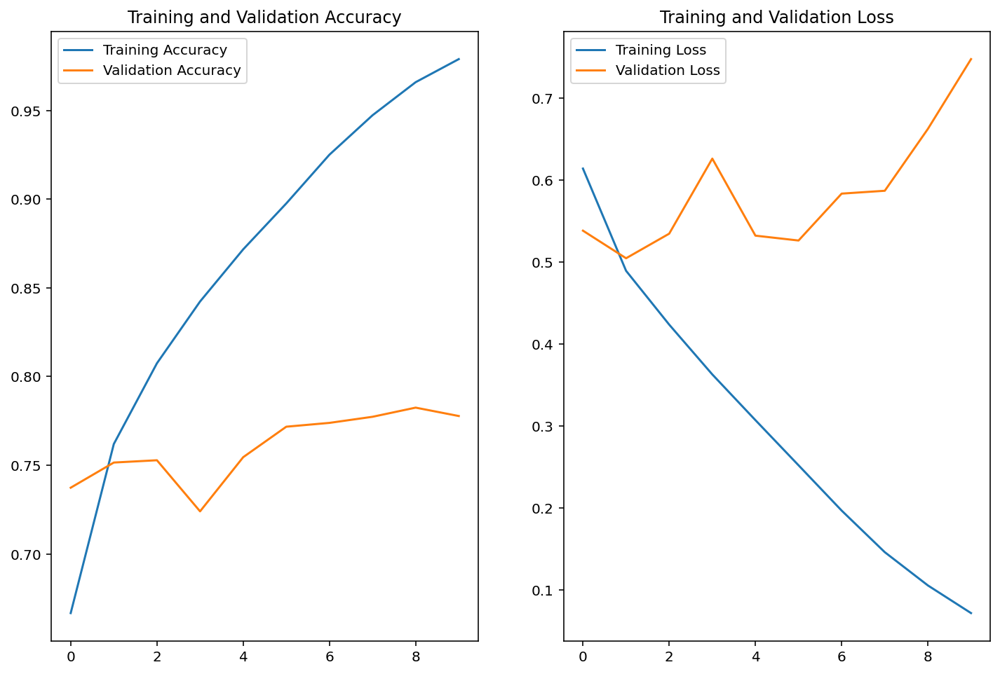

In [25]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [26]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[9.9999297e-01, 7.0685714e-06],
       [9.8726583e-01, 1.2734213e-02],
       [5.9161341e-01, 4.0838659e-01],
       [9.9996352e-01, 3.6495832e-05],
       [9.0094280e-01, 9.9057168e-02],
       [2.2082379e-02, 9.7791767e-01],
       [1.5105837e-02, 9.8489422e-01],
       [1.6621307e-01, 8.3378696e-01],
       [2.1416464e-01, 7.8583533e-01],
       [4.1725451e-01, 5.8274555e-01],
       [2.5889033e-01, 7.4110961e-01],
       [9.9859422e-01, 1.4057136e-03],
       [9.9915230e-01, 8.4767764e-04],
       [1.5276368e-04, 9.9984717e-01],
       [9.9604094e-01, 3.9590686e-03],
       [9.9994421e-01, 5.5824952e-05],
       [4.4365251e-01, 5.5634749e-01],
       [1.1419363e-06, 9.9999881e-01],
       [9.9746239e-01, 2.5375588e-03],
       [9.9852461e-01, 1.4753627e-03],
       [9.7657430e-01, 2.3425777e-02],
       [9.7827703e-01, 2.1723023e-02],
       [9.9998248e-01, 1.7580884e-05],
       [9.9940503e-01, 5.9499580e-04],
       [9.9929893e-01, 7.0107082e-04],
       [2.0579396e-01, 7.

In [27]:
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 0])

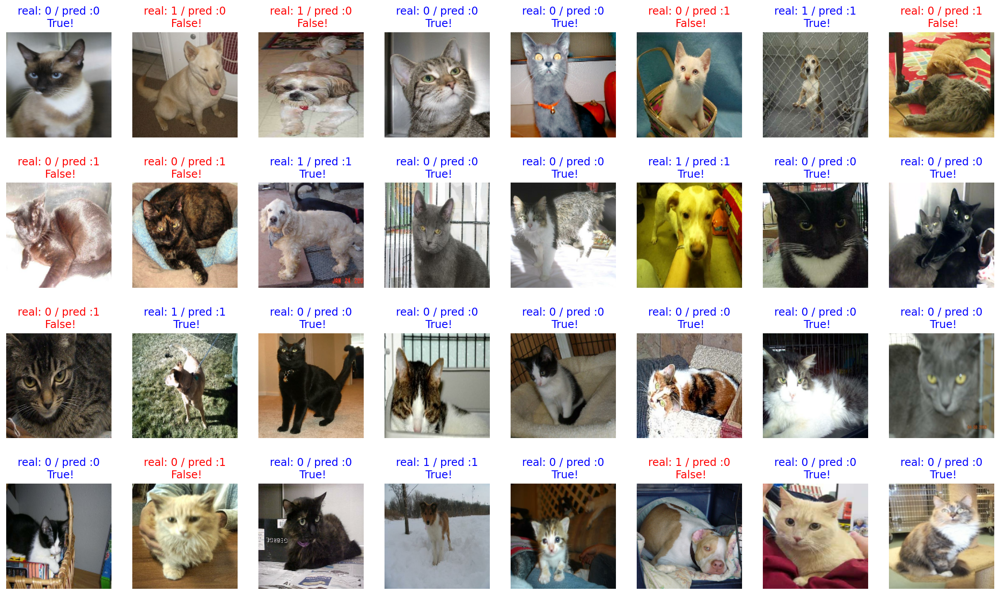

In [28]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [29]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

71.875


In [30]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [31]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [32]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [33]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [35]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [36]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [37]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [38]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
dense_layer = Dense(512, activation='relu')
# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [39]:
base_model.trainable = False
print("슝~")

슝~


In [40]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [41]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [43]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [44]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

 5/20 [======>.......................] - ETA: 1s - loss: 0.7124 - accuracy: 0.4313

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


18/20 [==========================>...] - ETA: 0s - loss: 0.7153 - accuracy: 0.4306

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


20/20 [==============================] - 6s 72ms/step - loss: 0.7141 - accuracy: 0.4313
initial loss: 0.71
initial accuracy: 0.43


In [45]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
166/582 [=======>......................] - ETA: 51s - loss: 0.3703 - accuracy: 0.8737

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 49s - loss: 0.3513 - accuracy: 0.8799

209/582 [=========>....................] - ETA: 49s - loss: 0.3473 - accuracy: 0.8810

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 41s - loss: 0.3138 - accuracy: 0.8913

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 13s - loss: 0.2627 - accuracy: 0.9054

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 11s - loss: 0.2604 - accuracy: 0.9059

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 9s - loss: 0.2590 - accuracy: 0.9058 

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 6s - loss: 0.2536 - accuracy: 0.9075

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 5s - loss: 0.2530 - accuracy: 0.9076

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.2478 - accuracy: 0.9095

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 107s 180ms/step - loss: 0.2478 - accuracy: 0.9095 - val_loss: 0.1712 - val_accuracy: 0.9325
Epoch 2/5
165/582 [=======>......................] - ETA: 1:02 - loss: 0.1628 - accuracy: 0.9343

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


198/582 [=========>....................] - ETA: 57s - loss: 0.1593 - accuracy: 0.9356

208/582 [=========>....................] - ETA: 56s - loss: 0.1613 - accuracy: 0.9351

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


280/582 [=============>................] - ETA: 45s - loss: 0.1626 - accuracy: 0.9329

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


488/582 [========================>.....] - ETA: 14s - loss: 0.1605 - accuracy: 0.9338

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


501/582 [========================>.....] - ETA: 12s - loss: 0.1603 - accuracy: 0.9339

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


512/582 [=========================>....] - ETA: 10s - loss: 0.1599 - accuracy: 0.9341

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


539/582 [==========================>...] - ETA: 6s - loss: 0.1591 - accuracy: 0.9349

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


545/582 [===========================>..] - ETA: 5s - loss: 0.1591 - accuracy: 0.9350

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1582 - accuracy: 0.9355

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 100s 169ms/step - loss: 0.1582 - accuracy: 0.9355 - val_loss: 0.1544 - val_accuracy: 0.9308
Epoch 3/5
166/582 [=======>......................] - ETA: 1:01 - loss: 0.1464 - accuracy: 0.9396

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 57s - loss: 0.1444 - accuracy: 0.9419

209/582 [=========>....................] - ETA: 55s - loss: 0.1448 - accuracy: 0.9414

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 45s - loss: 0.1480 - accuracy: 0.9393

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 13s - loss: 0.1466 - accuracy: 0.9399

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 12s - loss: 0.1463 - accuracy: 0.9400

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 10s - loss: 0.1461 - accuracy: 0.9399

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 6s - loss: 0.1456 - accuracy: 0.9401

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 5s - loss: 0.1455 - accuracy: 0.9402

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1450 - accuracy: 0.9408

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 100s 169ms/step - loss: 0.1450 - accuracy: 0.9408 - val_loss: 0.1456 - val_accuracy: 0.9351
Epoch 4/5
166/582 [=======>......................] - ETA: 1:01 - loss: 0.1336 - accuracy: 0.9435

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


199/582 [=========>....................] - ETA: 56s - loss: 0.1378 - accuracy: 0.9417

209/582 [=========>....................] - ETA: 55s - loss: 0.1362 - accuracy: 0.9426

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


281/582 [=============>................] - ETA: 44s - loss: 0.1383 - accuracy: 0.9417

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


489/582 [========================>.....] - ETA: 13s - loss: 0.1400 - accuracy: 0.9416

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


502/582 [========================>.....] - ETA: 11s - loss: 0.1394 - accuracy: 0.9418

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 10s - loss: 0.1388 - accuracy: 0.9419

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 6s - loss: 0.1384 - accuracy: 0.9422

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 5s - loss: 0.1379 - accuracy: 0.9425

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1381 - accuracy: 0.9423

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 100s 168ms/step - loss: 0.1381 - accuracy: 0.9423 - val_loss: 0.1576 - val_accuracy: 0.9351
Epoch 5/5
167/582 [=======>......................] - ETA: 35s - loss: 0.1280 - accuracy: 0.9484

Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


200/582 [=========>....................] - ETA: 32s - loss: 0.1296 - accuracy: 0.9484

210/582 [=========>....................] - ETA: 31s - loss: 0.1295 - accuracy: 0.9485

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9


282/582 [=============>................] - ETA: 25s - loss: 0.1305 - accuracy: 0.9478

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9


490/582 [========================>.....] - ETA: 7s - loss: 0.1346 - accuracy: 0.9454

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9


503/582 [========================>.....] - ETA: 6s - loss: 0.1342 - accuracy: 0.9453

Corrupt JPEG data: 128 extraneous bytes before marker 0xd9


513/582 [=========================>....] - ETA: 5s - loss: 0.1339 - accuracy: 0.9455

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


540/582 [==========================>...] - ETA: 3s - loss: 0.1340 - accuracy: 0.9455

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


546/582 [===========================>..] - ETA: 3s - loss: 0.1338 - accuracy: 0.9457

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


582/582 [==============================] - ETA: 0s - loss: 0.1333 - accuracy: 0.9459

Corrupt JPEG data: 162 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


582/582 [==============================] - 65s 109ms/step - loss: 0.1333 - accuracy: 0.9459 - val_loss: 0.1394 - val_accuracy: 0.9428


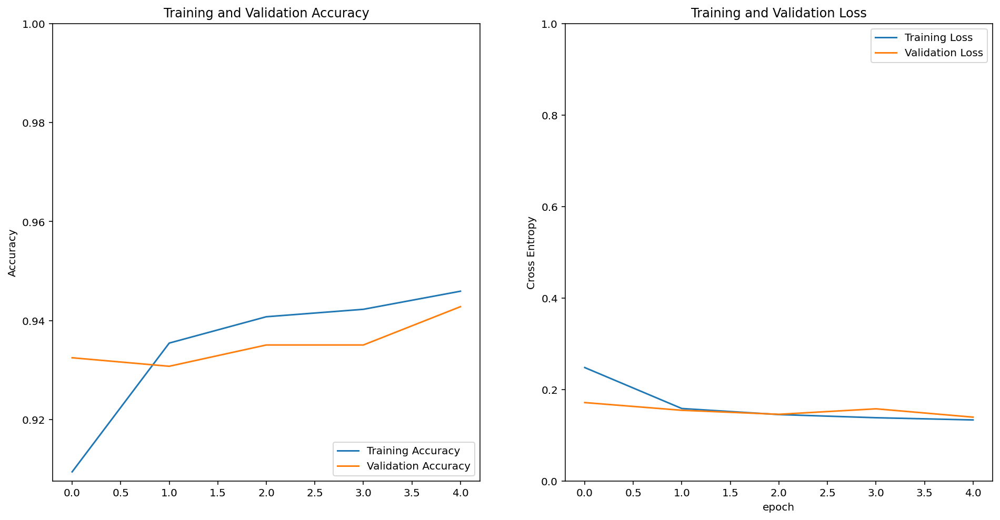

In [46]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [47]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9999142e-01, 8.6128339e-06],
       [9.1169871e-02, 9.0883011e-01],
       [2.5636166e-01, 7.4363834e-01],
       [9.9999607e-01, 3.9088372e-06],
       [9.9750262e-01, 2.4973548e-03],
       [9.8936731e-01, 1.0632709e-02],
       [1.7268315e-04, 9.9982733e-01],
       [6.1866689e-01, 3.8133314e-01],
       [9.4735318e-01, 5.2646745e-02],
       [9.5698959e-01, 4.3010373e-02],
       [5.9639049e-05, 9.9994040e-01],
       [9.9995601e-01, 4.3944743e-05],
       [9.9007964e-01, 9.9204127e-03],
       [3.6131751e-06, 9.9999642e-01],
       [9.9849880e-01, 1.5012095e-03],
       [9.8391563e-01, 1.6084377e-02],
       [9.9611390e-01, 3.8860452e-03],
       [2.4983112e-02, 9.7501683e-01],
       [5.5173820e-01, 4.4826174e-01],
       [9.9461985e-01, 5.3800978e-03],
       [9.1408604e-01, 8.5913971e-02],
       [9.8293847e-01, 1.7061608e-02],
       [9.9191779e-01, 8.0822539e-03],
       [9.7875309e-01, 2.1246918e-02],
       [9.9801314e-01, 1.9868815e-03],
       [9.7424877e-01, 2.

In [48]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

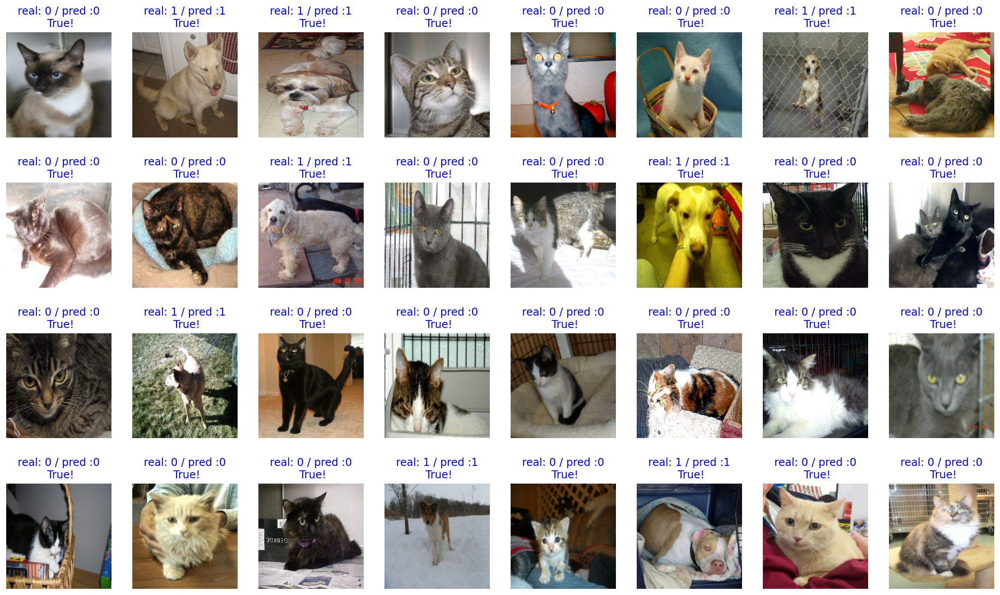

In [49]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [50]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


In [51]:
!mkdir -p ~/aiffel/cat_vs_dog/checkpoint
!mkdir -p ~/aiffel/cat_vs_dog/images

In [52]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [53]:
!ln -s ~/data/* ~/aiffel/cat_vs_dog/images/

ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/cat_face.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/cats_vs_dogs': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/my_cat.jpg': File exists
ln: failed to create symbolic link '/aiffel/aiffel/cat_vs_dog/images/my_dog.jpg': File exists


In [54]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

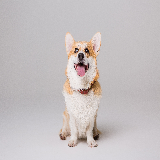

In [55]:
IMG_SIZE = 160
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [56]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [57]:
prediction = model.predict(dog_image)
prediction

array([[2.8320515e-13, 1.0000000e+00]], dtype=float32)

In [58]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 100% dog, and 0% cat.


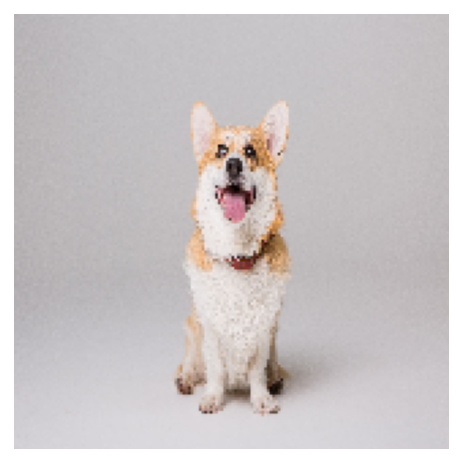

In [59]:
filename = 'my_dog.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


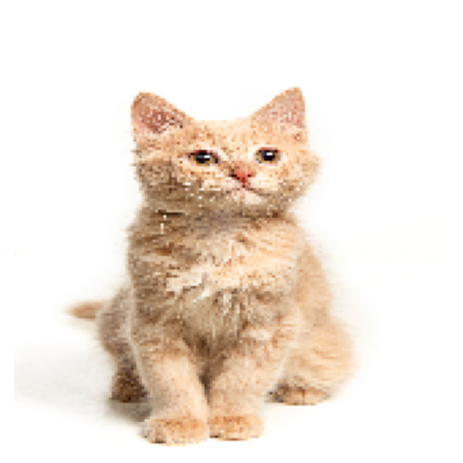

In [60]:
filename = 'my_cat.jpg'

show_and_predict_image(img_dir_path, filename)

This image seems 0% dog, and 100% cat.


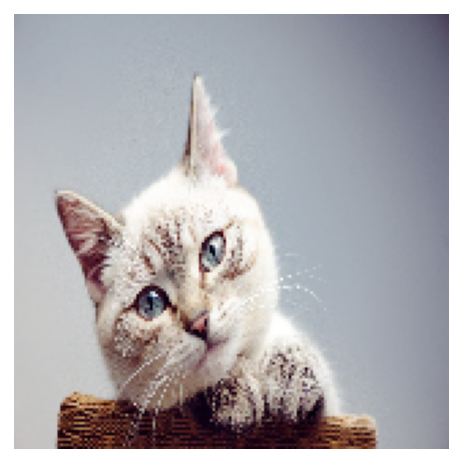

In [61]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)